# Drought hazard team SPI output processing

In [1]:
import sys
import os
import glob
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import rioxarray as rio
import geopandas
from shapely.geometry import mapping
from datetime import datetime
sys.path.append('/g/data/mn51/users/jb6465/drought-github/submodules/gwls')
from gwl import get_GWL_timeslice
sys.path.append('/g/data/mn51/users/jb6465/drought-github/percentiles_spi')
import utils

#### BC SWITCH (toggle on / off)

In [2]:
BC_SWITCH = True

#### Accumulation toggle

In [3]:
accumulation = 24

## GWL slicing

In [5]:
# GWL slicing git hash
import subprocess

def get_submodule_hash(submodule_path):
    result = subprocess.run(['git', '-C', submodule_path, 'rev-parse', 'HEAD'], 
                            capture_output=True, text=True, check=True)
    return result.stdout.strip()

# Example usage
submodule_path = '/g/data/mn51/users/jb6465/drought-github/submodules/gwls'
commit_hash = get_submodule_hash(submodule_path)
print(f"Submodule commit hash: {commit_hash}")

Submodule commit hash: 40fe88fca1eaab8491bb3a5b99167db817b24c65


In [16]:
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/full_period/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/GWLs/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/full_period/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/full_period/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/GWLs/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/full_period/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/GWLs/'

files = []
files.extend(sorted(glob.glob("{}/*{}".format(input_dir, '.nc'))))

for input_file in files:
    print(f"---> GWL slicing for {input_file.rpartition('/')[-1]}")
    model_list = ['CMCC-ESM2','ACCESS-ESM1-5','ACCESS-CM2','EC-Earth3','CESM2','CNRM-ESM2-1','MPI-ESM1-2-HR', 'NorESM2-MM'] 
    target_model = [model for model in model_list if model in input_file][0]
    variant_id = utils.data_source['CMIP6'][target_model]['variant-id']
    for GWL in [1.2, 1.5, 2.0, 3.0]:
        print('= GWL'+str(GWL))
        GWL_timeslice = get_GWL_timeslice(xr.open_dataset(input_file),'CMIP6',target_model,variant_id,'ssp370',GWL)

        # write to netcdf in output_dir
        GWL_timeslice.attrs['description'] = f"Standardised Precipitation Index computed using method of McKee et al. 1993 for {target_model} GWL{str(GWL)} using a base period of 1965-2014. Further details in supporting technical documentation."
        GWL_timeslice.attrs['created'] = (datetime.now()).strftime("%d/%m/%Y %H:%M:%S")
        GWL_timeslice.attrs['comment'] = f"Using data on {input_dir}"
        GWL_timeslice.attrs['GWL'] = f"GWL {str(GWL)}. Sliced using get_GWL_timeslice function from https://github.com/AusClimateService/gwls. Submodule commit hash: {commit_hash}"
        GWL_timeslice.to_netcdf(f"{output_dir}{input_file.rpartition('/')[-1][:-3]}_GWL{str(GWL)}.nc")

---> GWL slicing for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_ACCESS-ESM1-5_ssp370_r6i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_ACCESS-ESM1-5_ssp370_r6i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_CESM2_ssp370_r11i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_CESM2_ssp370_r11i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022.nc
= GWL1.2
= GWL1.5
= GWL2.0
= GWL3.0
---> GWL slicing for SPI24_AGCD-05i_CMCC-ESM2_ssp370_r1i1p1f1_BOM_v1-r1_

IndexError: list index out of range

## Percent time below SPI < -1

In [71]:
SPI_threshold = -1
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/GWLs/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/GWLs/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/GWLs/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'

files = []
files.extend(sorted(glob.glob("{}/*{}".format(input_dir, '.nc'))))

In [72]:
files

['/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.5.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL2.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL3.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/GWLs/SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscal

In [86]:
print(f"Computing pct time below {str(SPI_threshold)}")
for spi_file in files:
    print(f"-> for {spi_file.rpartition('/')[-1]}")
    spi_xr = xr.open_dataset(spi_file)
    pct_below_thresh = 100*((spi_xr[list(spi_xr.data_vars)[0]])<=SPI_threshold).sum(dim='time')/len(spi_xr[list(spi_xr.data_vars)[0]].time) 
    
    # write to netcdf in output_dir
    pct_below_thresh.attrs['description'] = f"Standardised Precipitation Index percent of months below {str(SPI_threshold)} for input file: {spi_file.rpartition('/')[-1]} in {input_dir}. "
    pct_below_thresh.attrs['created'] = (datetime.now()).strftime("%d/%m/%Y %H:%M:%S")
    pct_below_thresh.attrs['GWL'] = f"GWL {spi_file[-6:-3]}. Sliced using get_GWL_timeslice function from https://github.com/AusClimateService/gwls. Submodule commit hash: {commit_hash}"
    pct_below_thresh.to_netcdf(f"{output_dir}{(spi_file.rpartition('/')[-1][:-3])[:5]+'pct_time_below_-1_'+(spi_file.rpartition('/')[-1][:-3]).partition('_')[-1]}.nc", mode='w')

Computing pct time below -1
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.5.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL2.0.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL3.0.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.5.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL2.0.nc
-> for SPI24_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL3.0.nc
-> for SPI24_AGCD-05i_ACCESS-ESM1-5_ssp370_r6i1p1f1_BOM_v1-r1_baseperiod1965

In [134]:
accumulation = 24

### 10-50-90 Percentiles for GWL and change between GWLs

In [135]:
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'

files = []
files.extend(sorted(glob.glob("{}/*pct_time_below*baseperiod19652014*{}".format(input_dir, '.nc'))))

In [136]:
files

['/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.5.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL2.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL3.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_

In [158]:
target_lon = xr.open_dataset('/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/SPI24pct_time_below_-1__ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_raw_GWL3.0.nc')['lon']
target_lat = xr.open_dataset('/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/SPI24pct_time_below_-1__ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_raw_GWL3.0.nc')['lat']

for GWL in [1.2, 1.5, 2.0, 3.0]:
    print(f"Computing 10-50-90th percentiles of MME for GWL{str(GWL)}")
    GWL_file_list = [file for file in files if f"GWL{str(GWL)}" in file]
    GWL_ens_list = [file[91:-35] for file in files if f"GWL{str(GWL)}" in file] if BC_SWITCH == False else [file.rpartition('/')[-1][32:-58] for file in files if f"GWL{str(GWL)}" in file] if BC_SWITCH == True else [file[87:-39] for file in files if f"GWL{str(GWL)}" in file] if BC_SWITCH == False else [file.rpartition('/')[-1][32:-58] for file in files if f"GWL{str(GWL)}" in file]
    MME_xr = xr.concat([xr.open_dataset(file).assign_coords(MME=ensemble) for file, ensemble in zip(GWL_file_list, GWL_ens_list)], dim='MME') if BC_SWITCH == True else xr.concat([xr.open_dataset(file).interp(lon=target_lon, lat=target_lat).assign_coords(MME=ensemble) for file, ensemble in zip(GWL_file_list, GWL_ens_list)], dim='MME')
    
    p10_50_90_xr = MME_xr.quantile([0.1,0.5,0.9], dim ='MME')
    p10_50_90_xr.attrs['description'] = f"10th, 50th and 90th percentile of MME for pct of months below Standardised Precipitation Index of -1. "
    p10_50_90_xr.attrs['comment'] = f"Using data on {input_dir}"
    p10_50_90_xr.attrs['created'] = (datetime.now()).strftime("%d/%m/%Y %H:%M:%S")
    p10_50_90_xr.attrs['GWL'] = f"GWL {str(GWL)}. Sliced using get_GWL_timeslice function from https://github.com/AusClimateService/gwls. Submodule commit hash: {commit_hash}"
    p10_50_90_xr.attrs['cell_methods'] = "quantile: 0.1, 0.5, 0.9"
    file_name = f"{output_dir}SPI{accumulation}_pct_time_below_-1_GWL_{str(GWL)}_percentiles_10-50-90.nc" if BC_SWITCH == False else f"{output_dir}SPI{accumulation}_pct_time_below_-1_GWL_{str(GWL)}_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc"
    p10_50_90_xr.to_netcdf(file_name, mode='w')

    #10-50-90th percentile of percent change 
    if GWL != 1.2:
        print(f"---> Computing MME change 10-50-90th percentiles for GWL{str(GWL)} and GWL1.2")
        GWL12_file_list = [file for file in files if "GWL1.2" in file]
        GWL12_ens_list = [file[91:-35] for file in files if "GWL1.2" in file] if BC_SWITCH == False else [file.rpartition('/')[-1][32:-58] for file in files if "GWL1.2" in file] if BC_SWITCH == True else [file[87:-39] for file in files if "GWL1.2" in file] if BC_SWITCH == False else [file.rpartition('/')[-1][32:-58] for file in files if "GWL1.2" in file]
        MME_GWL12_xr = xr.concat([xr.open_dataset(file).assign_coords(MME=ensemble) for file, ensemble in zip(GWL12_file_list, GWL12_ens_list)], dim='MME') if BC_SWITCH == True else xr.concat([xr.open_dataset(file).interp(lon=target_lon, lat=target_lat).assign_coords(MME=ensemble) for file, ensemble in zip(GWL12_file_list, GWL12_ens_list)], dim='MME')

        MME_change = ((MME_xr-MME_GWL12_xr)/MME_GWL12_xr)*100
        MME_change_p10_50_90 = MME_change.quantile([0.1,0.5,0.9], dim ='MME')
        MME_change_p10_50_90.attrs['description'] = f"Change between GWL{str(GWL)} and GWL1.2 for 10th, 50th and 90th percentile of MME for pct of months below Standardised Precipitation Index of -1. "
        MME_change_p10_50_90.attrs['comment'] = f"Using data on {input_dir}"
        MME_change_p10_50_90.attrs['created'] = (datetime.now()).strftime("%d/%m/%Y %H:%M:%S")
        MME_change_p10_50_90.attrs['cell_methods'] = "quantile: 0.1, 0.5, 0.9"
        file_name = f"{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentiles_10-50-90.nc" if BC_SWITCH == False else f"{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc"
        MME_change_p10_50_90.to_netcdf(file_name, mode='w')

Computing 10-50-90th percentiles of MME for GWL1.2
Computing 10-50-90th percentiles of MME for GWL1.5
---> Computing MME change 10-50-90th percentiles for GWL1.5 and GWL1.2


/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4658: RuntimeWarning: invalid value encountered in subtract
  subtract(b, diff_b_a * (1 - t), out=lerp_interpolation, where=t >= 0.5,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


Computing 10-50-90th percentiles of MME for GWL2.0
---> Computing MME change 10-50-90th percentiles for GWL2.0 and GWL1.2


/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4658: RuntimeWarning: invalid value encountered in subtract
  subtract(b, diff_b_a * (1 - t), out=lerp_interpolation, where=t >= 0.5,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


Computing 10-50-90th percentiles of MME for GWL3.0
---> Computing MME change 10-50-90th percentiles for GWL3.0 and GWL1.2


/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4658: RuntimeWarning: invalid value encountered in subtract
  subtract(b, diff_b_a * (1 - t), out=lerp_interpolation, where=t >= 0.5,
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4657: RuntimeWarning: invalid value encountered in multiply
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/g/data/hh5/public/apps/cms_conda/envs/analysis3-24.04/lib/python3.10/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


GWL1.5-GWL1.2


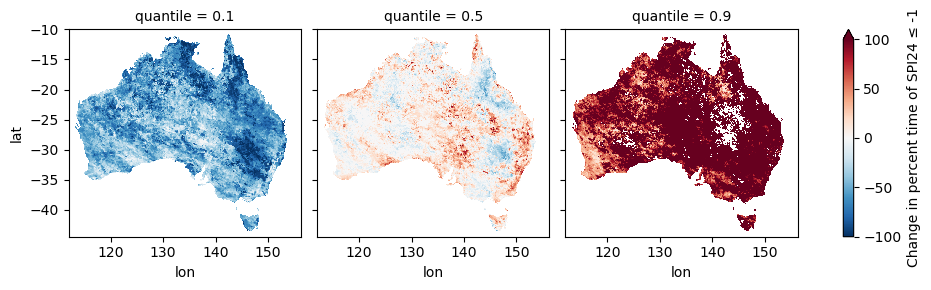

GWL2.0-GWL1.2


<Figure size 640x480 with 0 Axes>

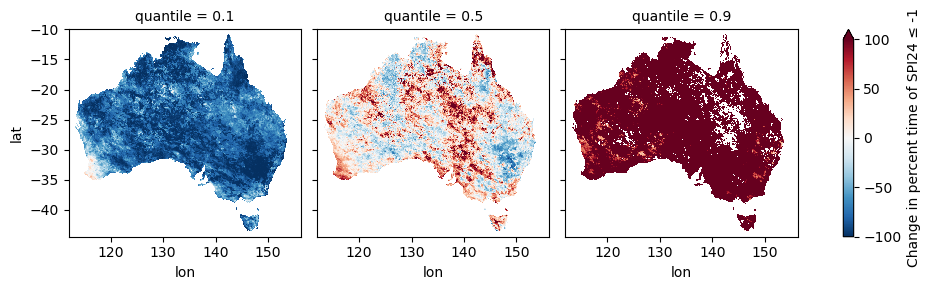

GWL3.0-GWL1.2


<Figure size 640x480 with 0 Axes>

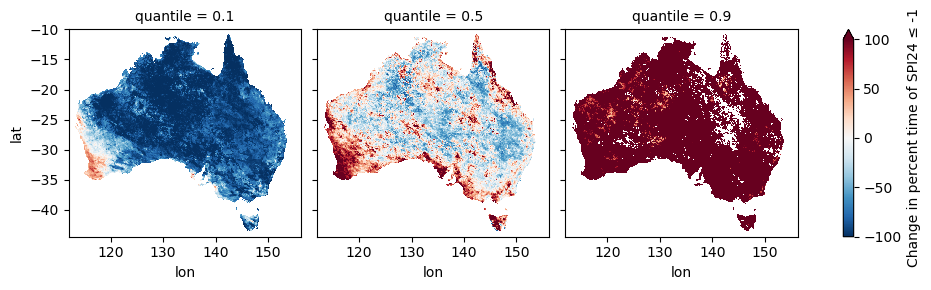

<Figure size 640x480 with 0 Axes>

In [159]:
#quick check of outputs
for GWL in [1.5, 2.0, 3.0]:
    print(f"GWL{str(GWL)}-GWL1.2")
    quick_check_ds = xr.open_dataset(f"{output_dir}/SPI24_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc")
    quick_check_ds.SPI24.plot(col="quantile",cmap="RdBu_r", cbar_kwargs={'label': f'Change in percent time of SPI{accumulation} ≤ -1'}, vmin=-100, vmax=100)
    plt.show()
    plt.clf()

## Plotting

##### Run from here only if just plotting

In [4]:
cd /g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps

/g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps


In [5]:
from acs_plotting_maps import plot_acs_hazard, regions_dict, cmap_dict, tick_dict

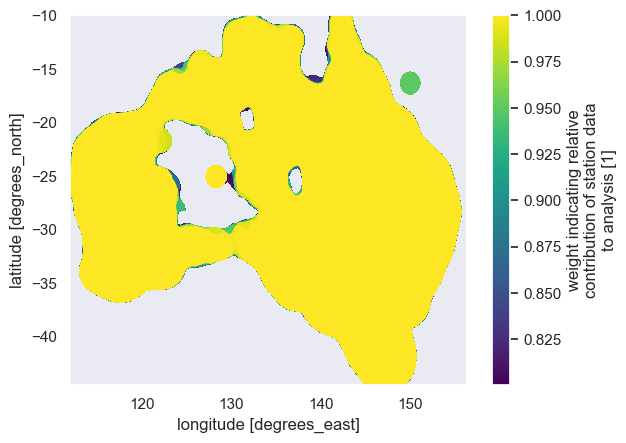

In [151]:
mask_ds = xr.open_dataset("/g/data/mn51/users/dh4185/agcd_v1-0-2_precip_weight_r005_daily_1975_2005fraction_ge1.nc")
q_mask = np.ma.masked_greater(mask_ds.fraction,0.8)
mask_ds.fraction.where(q_mask.mask).plot()

In [7]:
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'

files = []
files.extend(sorted(glob.glob("{}/*pct_time_below*baseperiod19652014*{}".format(input_dir, '.nc'))))

/g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps/acs_plotting_maps.py:443: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(


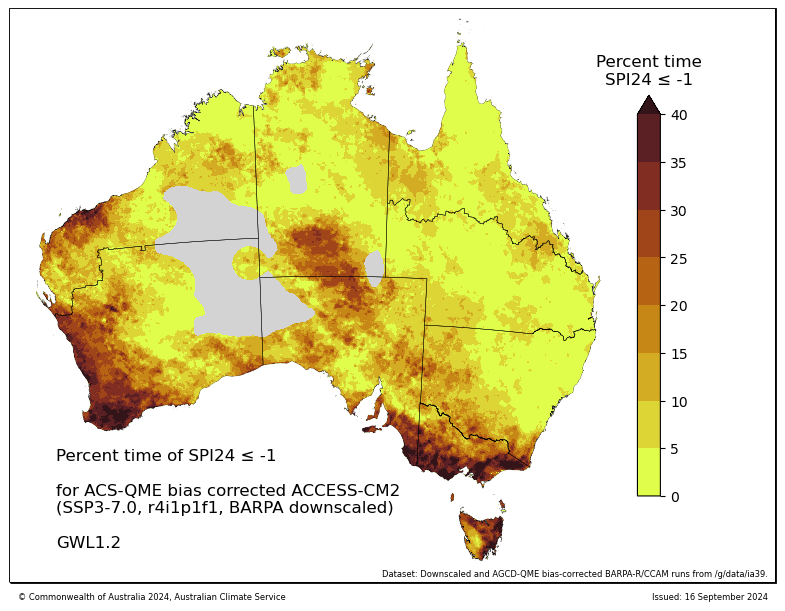

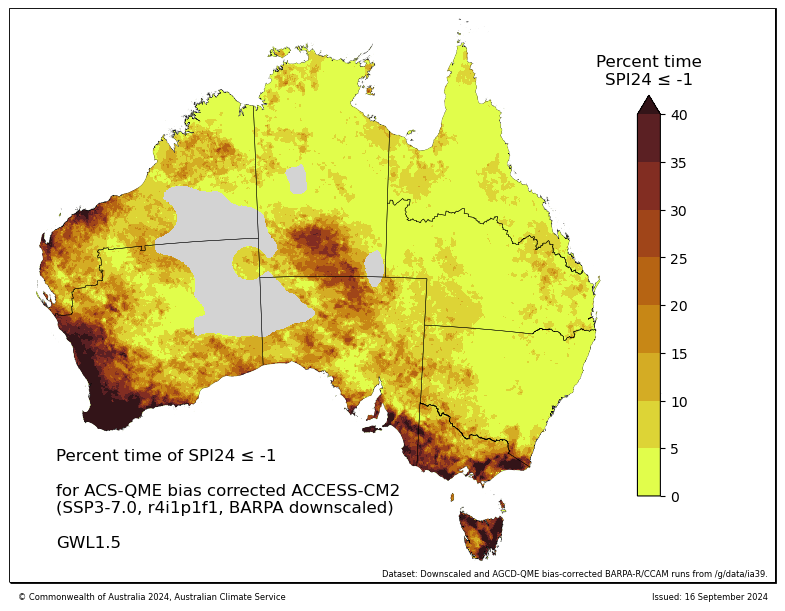

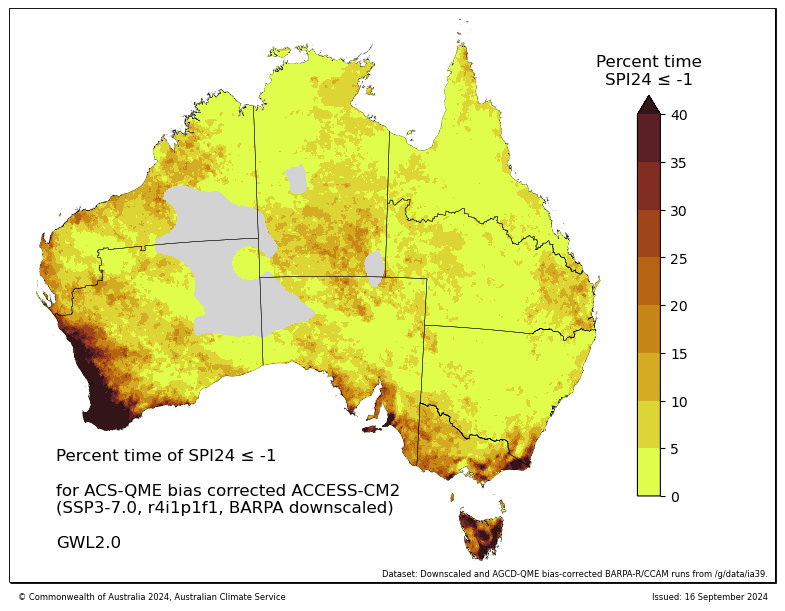

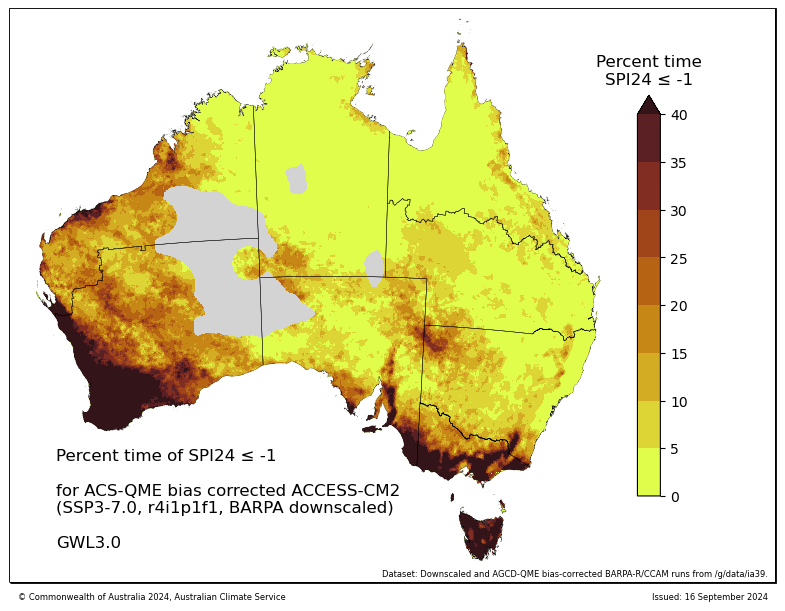

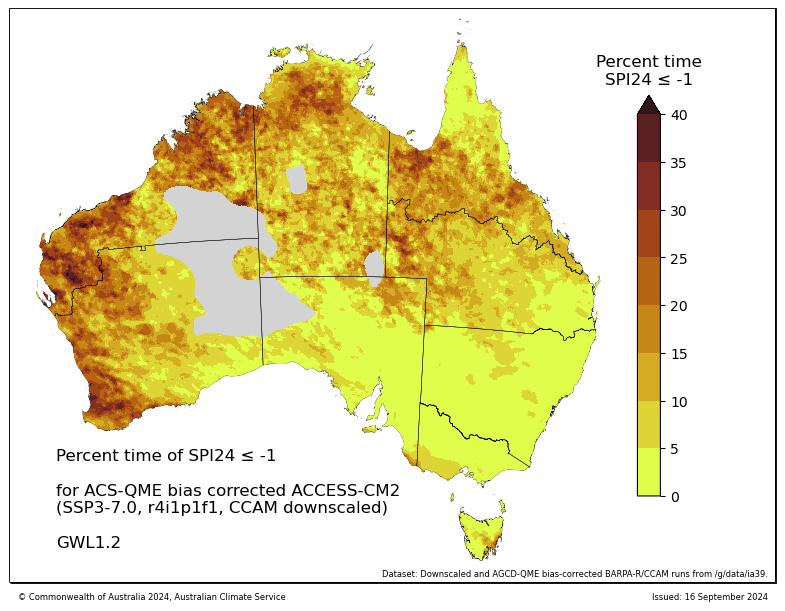

...

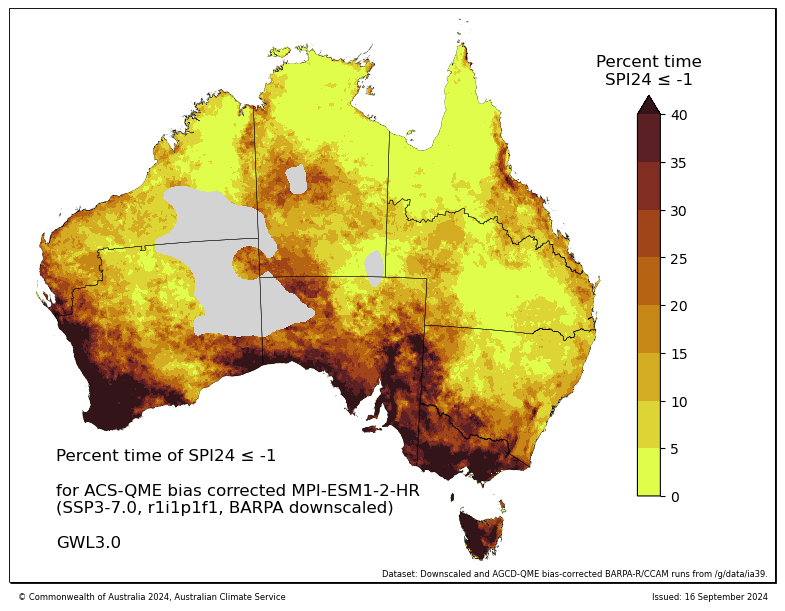

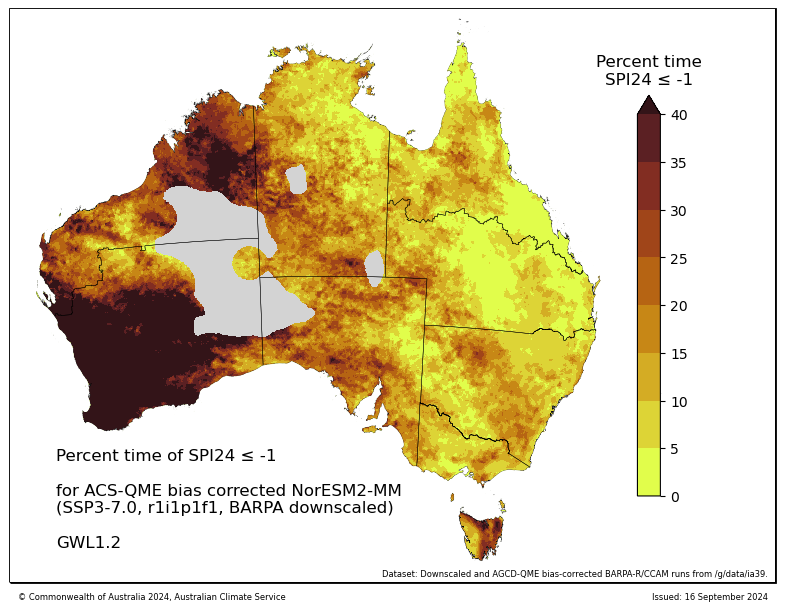

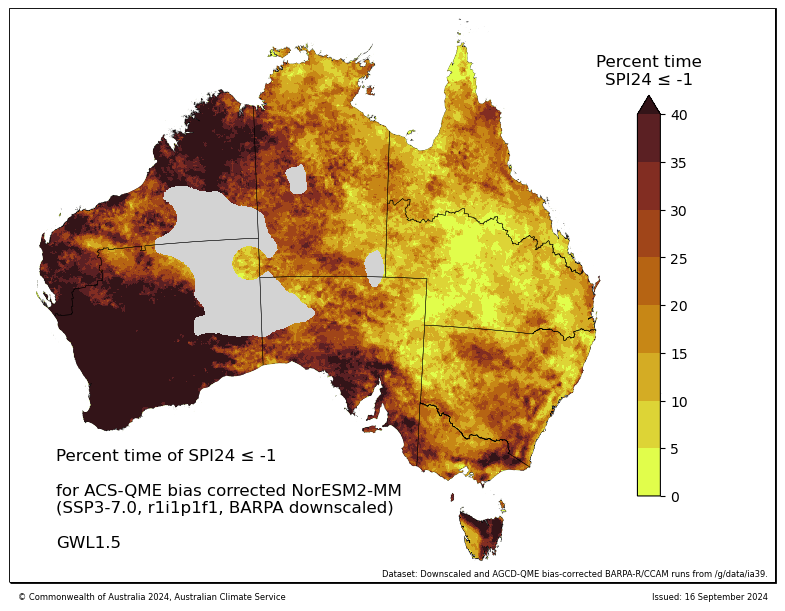

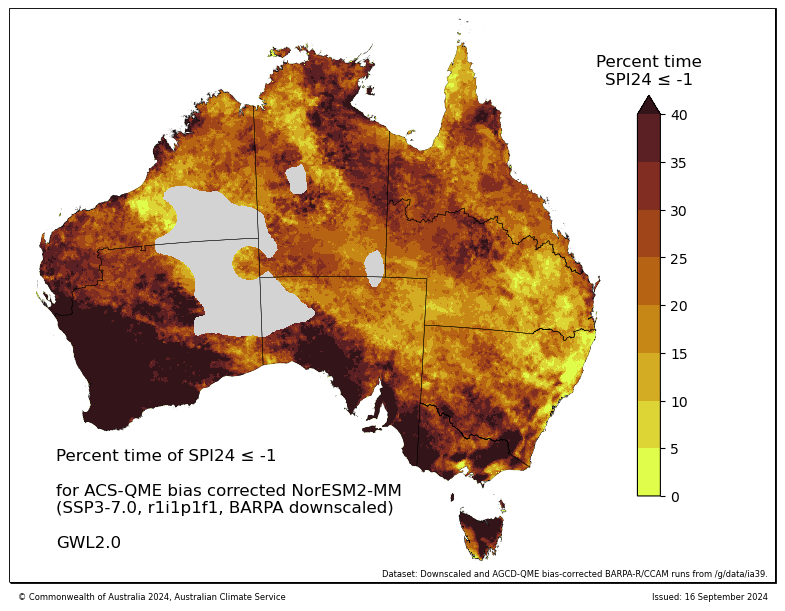

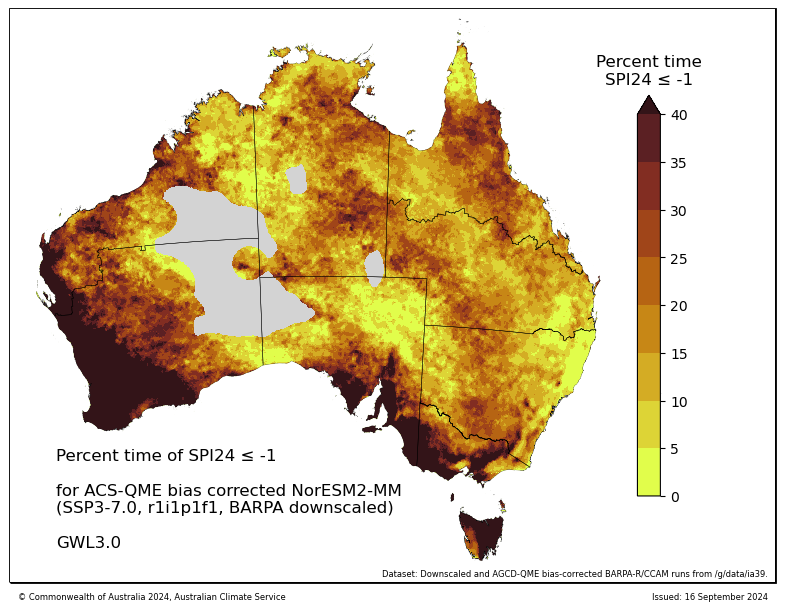

In [96]:
for file in files:
    cmap_grey_mask = cmap_dict["pr_chance_extremes"]
    cmap_grey_mask.set_bad(color="lightgrey")
    ensemble_info_str = f"ACS-QME bias corrected {file.rpartition('/')[-1][32:-58].partition('_')[0]} \n(SSP3-7.0, {(file.rpartition('/')[-1][32:-58]).partition('_')[2].partition('_')[2].partition('_')[0]}, {'BARPA' if (file.rpartition('/')[-1][32:-58]).partition('_')[2].partition('_')[2].partition('_')[2] == 'BOM' else 'CCAM'} downscaled)" if BC_SWITCH == True else f"ACS raw {file.rpartition('/')[-1].partition('_')[2][15:].partition('_')[0]} \n(SSP3-7.0, {file.rpartition('/')[-1].partition('_')[2][15:].partition('_')[2].partition('_')[2].partition('_')[0]}, {'BARPA' if 'BOM' in file else 'CCAM'} downscaled)"
    plot_acs_hazard(data = (xr.open_dataset(file).where(q_mask.mask).SPI24) ,
                    regions = regions_dict['ncra_regions'],
                    cmap = cmap_grey_mask,
                    facecolor = 'lightgrey',
                    land_shadow=True,
                    ticks = np.arange(0, 40.1, 5),
                    cbar_label = f"Percent time\nSPI{accumulation} ≤ -1",
                    cbar_extend = "max",
                    title = f"Percent time of SPI{accumulation} ≤ -1\n\nfor {ensemble_info_str}\n",
                    dataset_name = "Downscaled, not bias-corrected BARPA-R/CCAM runs from /g/data/ia39." if BC_SWITCH == False else "Downscaled and AGCD-QME bias-corrected BARPA-R/CCAM runs from /g/data/ia39.",
                    date_range = f"GWL{file[-6:-3]}",
                    contourf = False,
                    contour = False,
                    watermark= None,
                    outfile = f"{output_dir}figures/individual_ens/SPI{accumulation}_pct_time_below_-1_GWL{file[-6:-3]}_ACS-QME-AGCD-1960-2022_{file.rpartition('/')[-1].partition('_')[2][15:].partition('_')[0]}_{'BARPA' if 'BOM' in file else 'CCAM'}.png" if BC_SWITCH == True else f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_GWL{file[-6:-3]}_ACS-QME-AGCD-1960-2022_{file.rpartition('/')[-1][32:-58]}_masked.png"
                );

CPU times: user 1min 20s, sys: 861 ms, total: 1min 21s
Wall time: 1min 21s


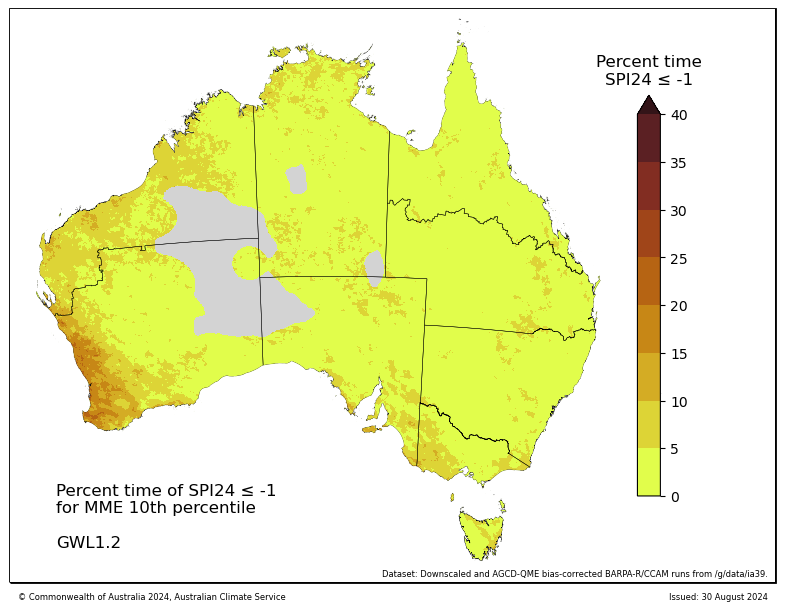

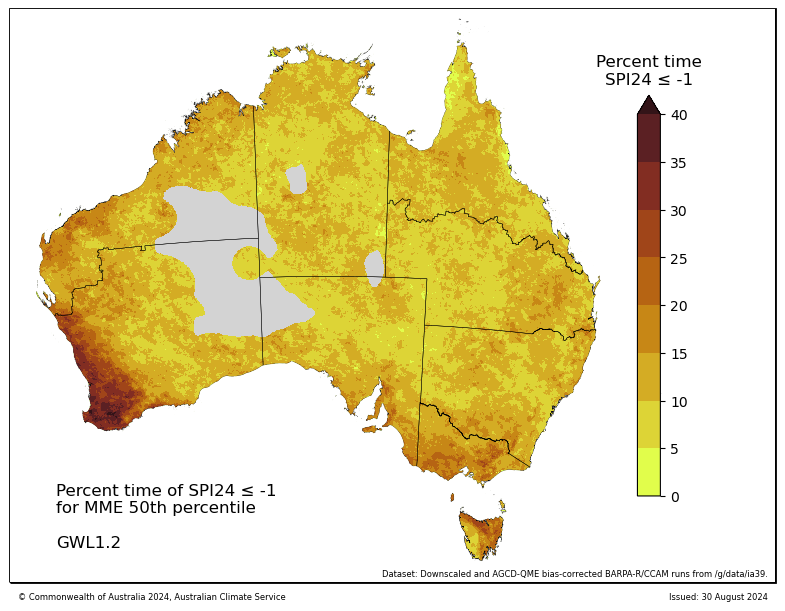

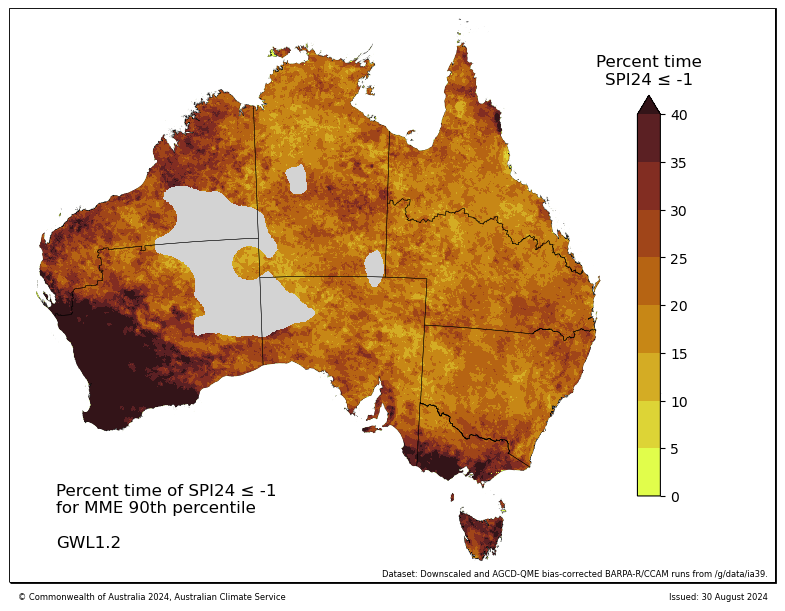

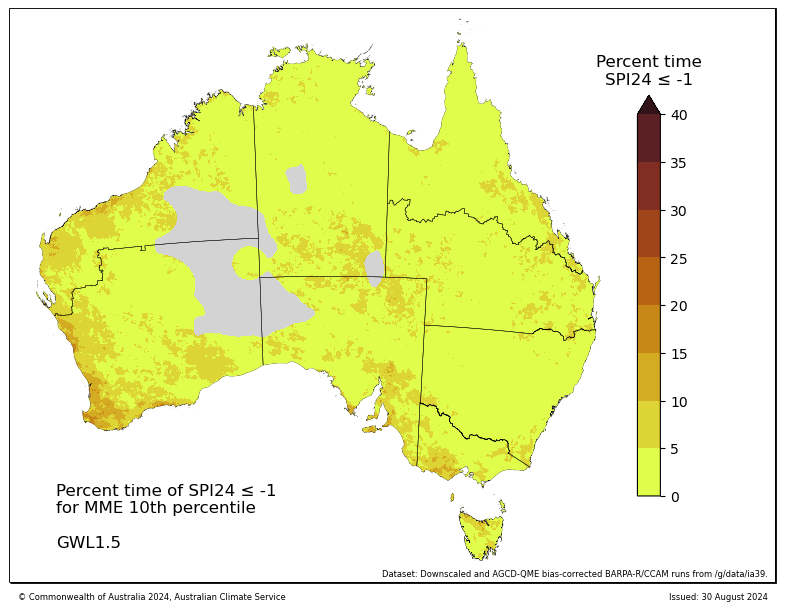

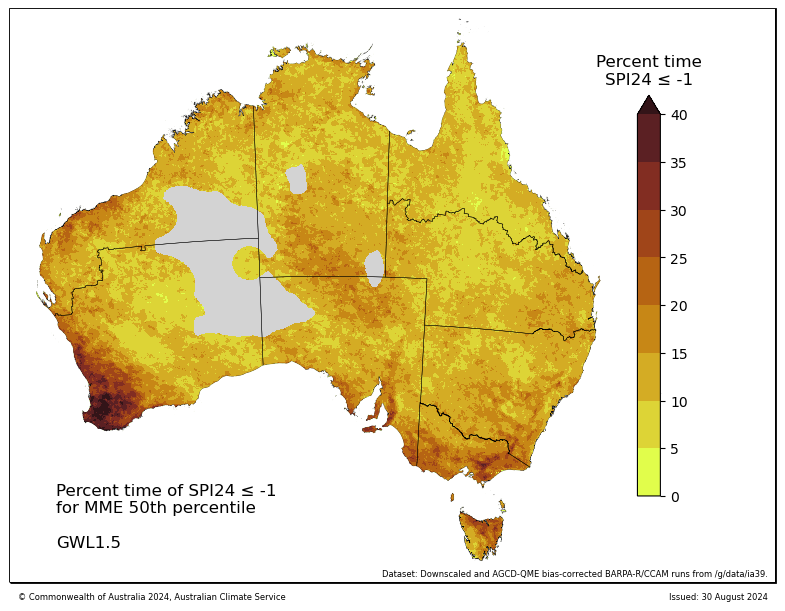

...

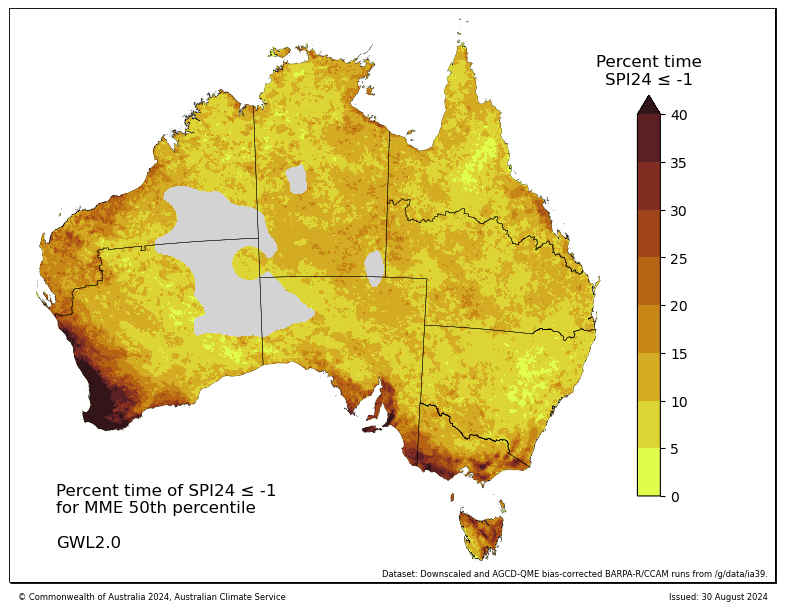

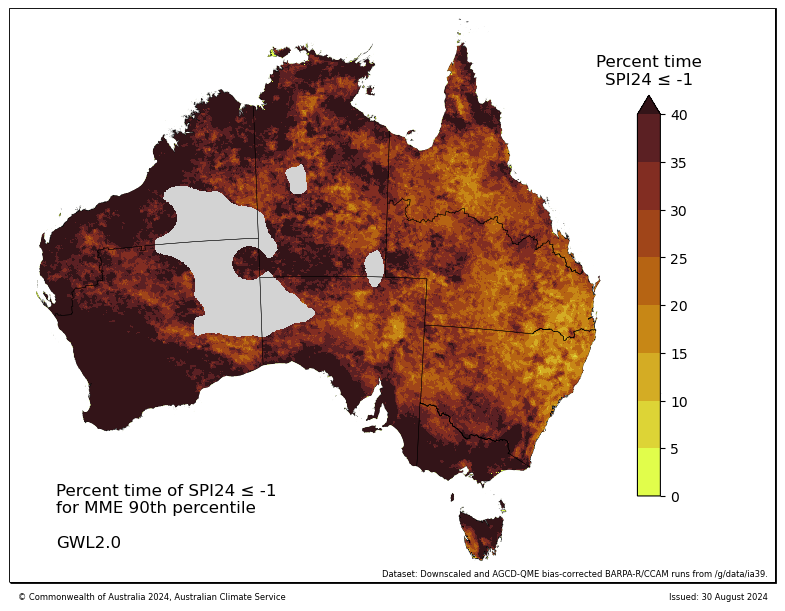

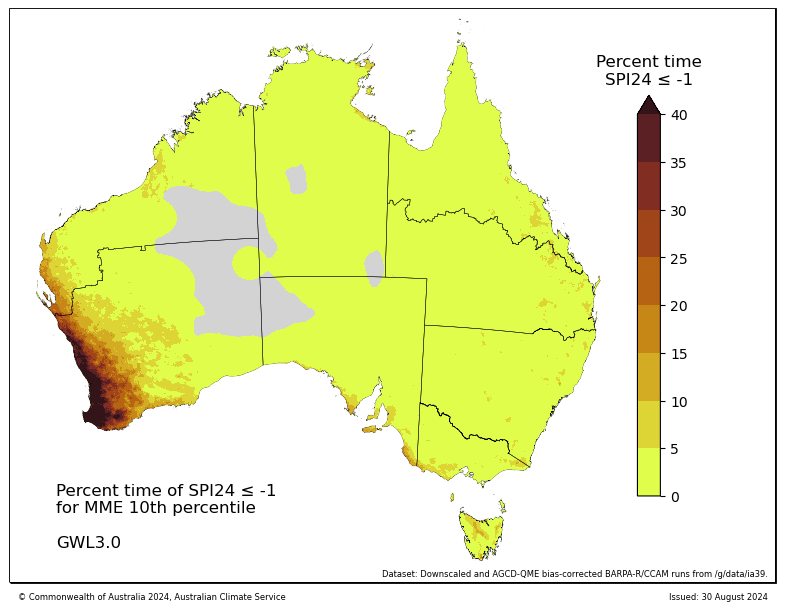

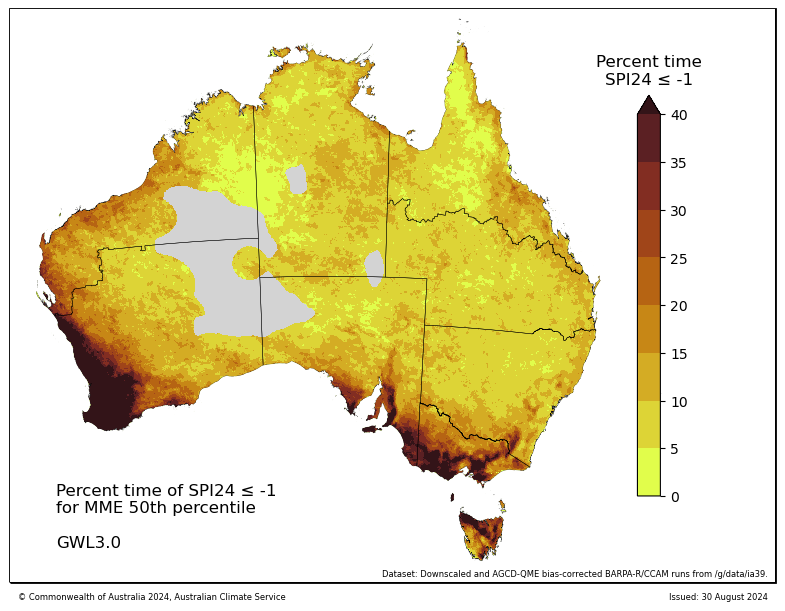

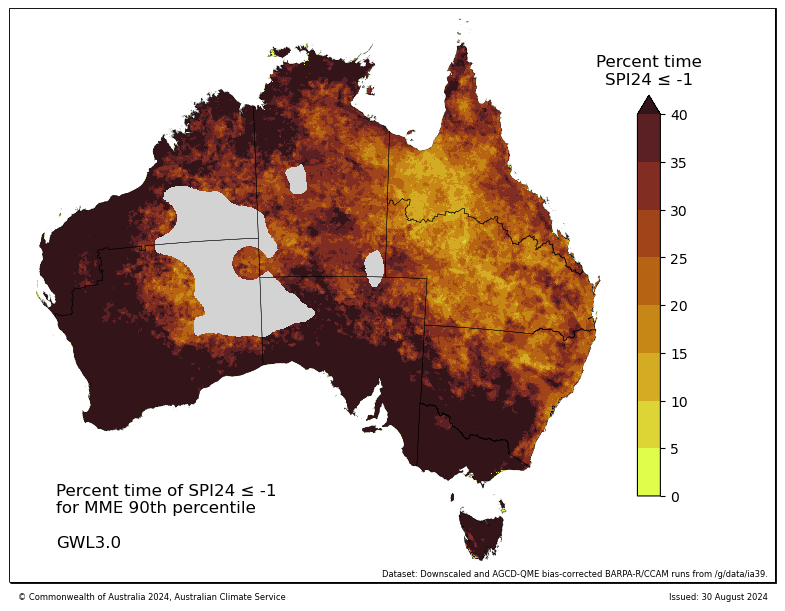

In [165]:
%%time
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'

    
for GWL in [1.2, 1.5, 2.0, 3.0]:
    for percentile in [0.1, 0.5, 0.9]:
        plot_file = f'{output_dir}SPI{accumulation}_pct_time_below_-1_GWL_{str(GWL)}_percentiles_10-50-90.nc' if BC_SWITCH == False else f'{output_dir}SPI{accumulation}_pct_time_below_-1_GWL_{str(GWL)}_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc' if BC_SWITCH == True else f'{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentiles_10-50-90.nc' if BC_SWITCH == False else f'{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc'
        cmap_grey_mask = cmap_dict["pr_chance_extremes"]
        cmap_grey_mask.set_bad(color="lightgrey")
        
        plot_acs_hazard(data = (xr.open_dataset(plot_file).sel(quantile=percentile).SPI24) if BC_SWITCH == False else (xr.open_dataset(plot_file).sel(quantile=percentile).SPI24).where(q_mask.mask) ,
                        regions = regions_dict['ncra_regions'],
                        cmap = cmap_grey_mask,
                        facecolor = 'lightgrey',
                        land_shadow=True,
                        ticks = np.arange(0, 40.1, 5),
                        cbar_label = f"Percent time\nSPI{accumulation} ≤ -1",
                        cbar_extend = "max",
                        title = f"Percent time of SPI{accumulation} ≤ -1\nfor MME {str(int(percentile*100))}th percentile\n",
                        dataset_name = "Downscaled, not bias-corrected BARPA-R/CCAM runs from /g/data/ia39." if BC_SWITCH == False else "Downscaled and AGCD-QME bias-corrected BARPA-R/CCAM runs from /g/data/ia39.",
                        date_range = f"GWL{str(GWL)}",
                        contourf = False,
                        contour = False,
                        watermark= None,
                        outfile = f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_GWL{str(GWL)}_percentile_{str(int(percentile*100))}.png" if BC_SWITCH == False else f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_GWL{str(GWL)}_ACS-QME-AGCD-1960-2022_percentile_{str(int(percentile*100))}_masked.png" if BC_SWITCH == True else f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentile_{str(int(percentile*100))}.png"
                    );


CPU times: user 1min 1s, sys: 420 ms, total: 1min 2s
Wall time: 1min 2s


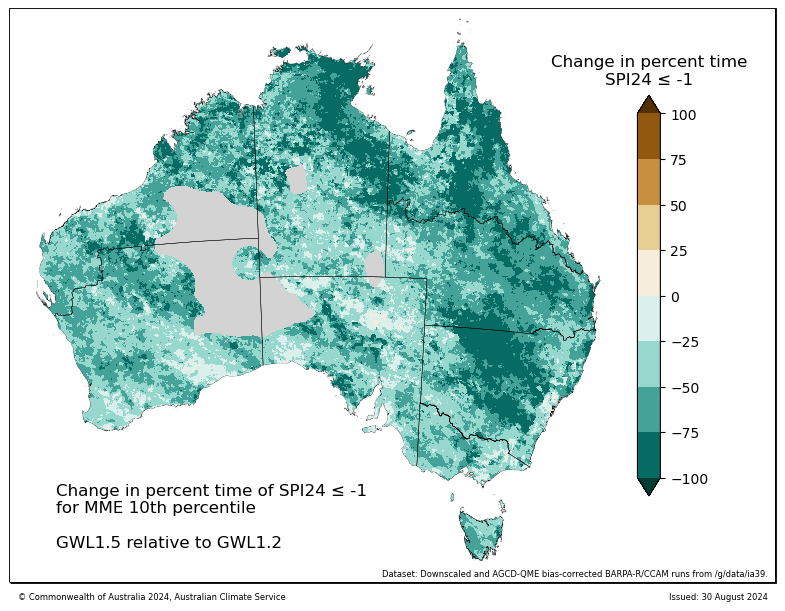

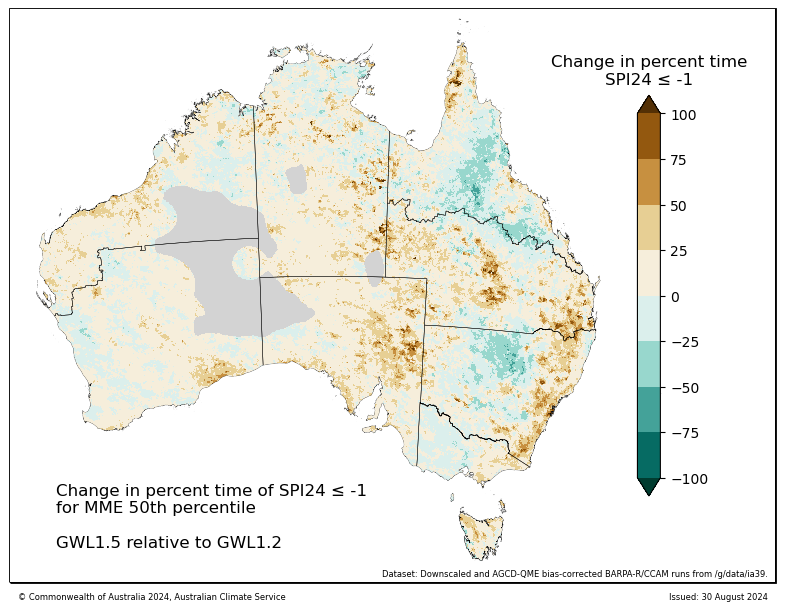

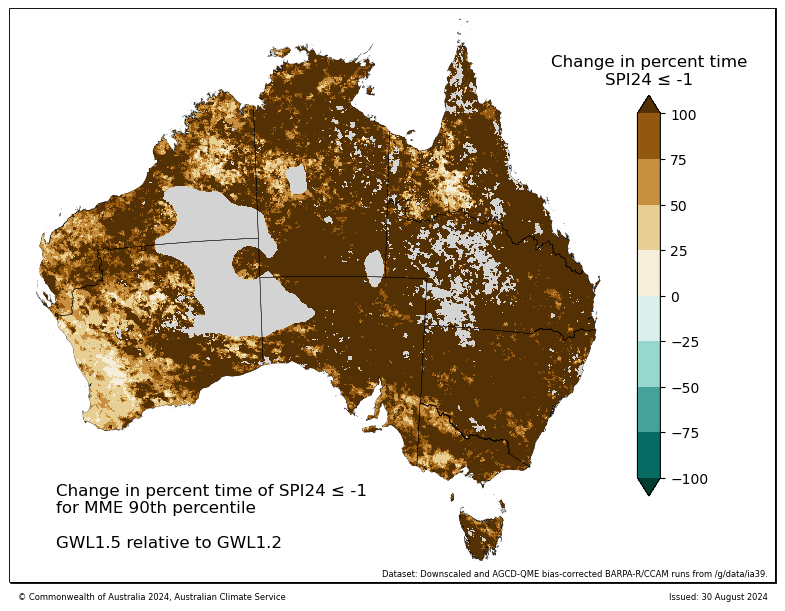

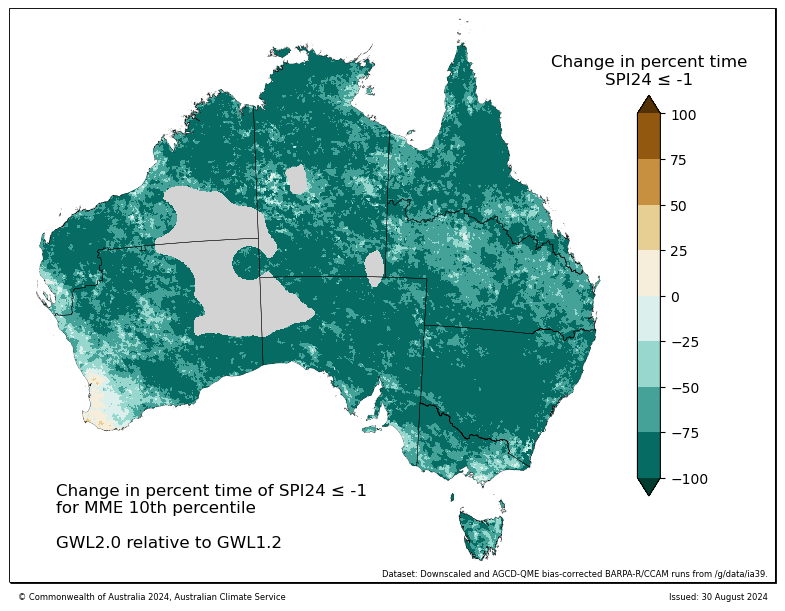

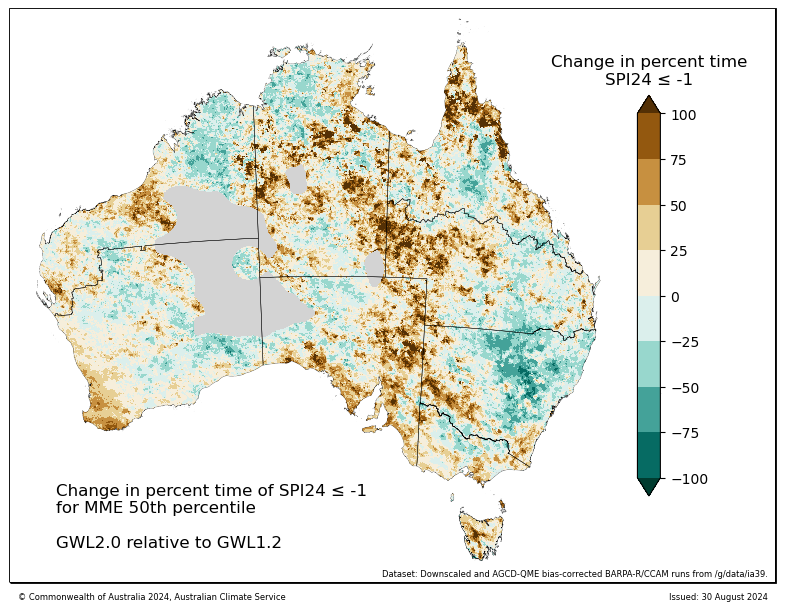

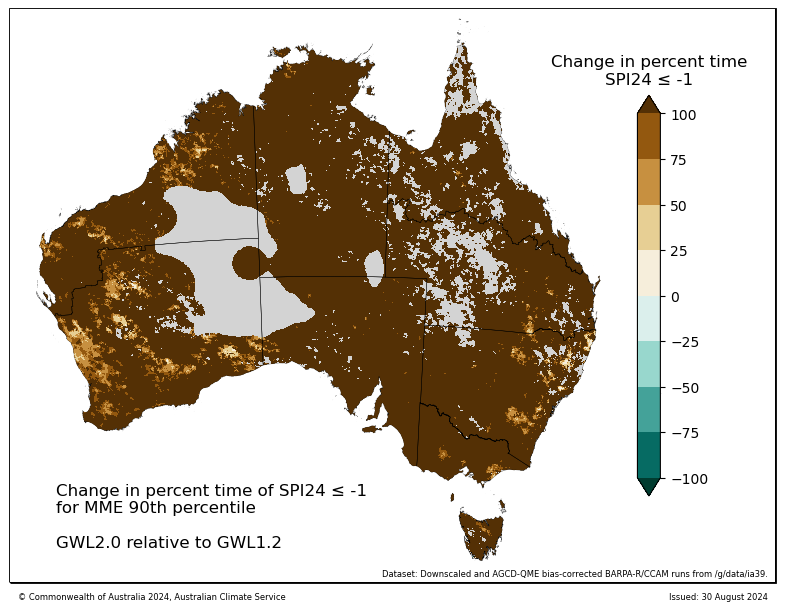

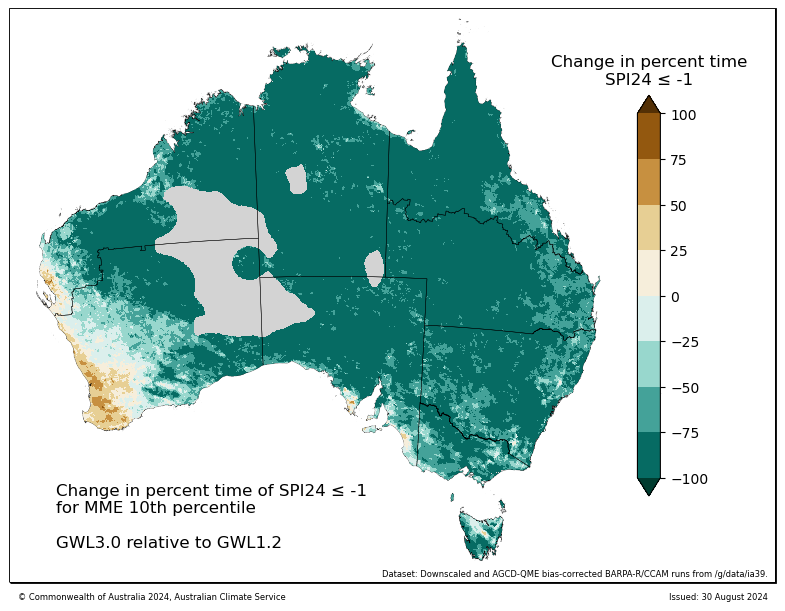

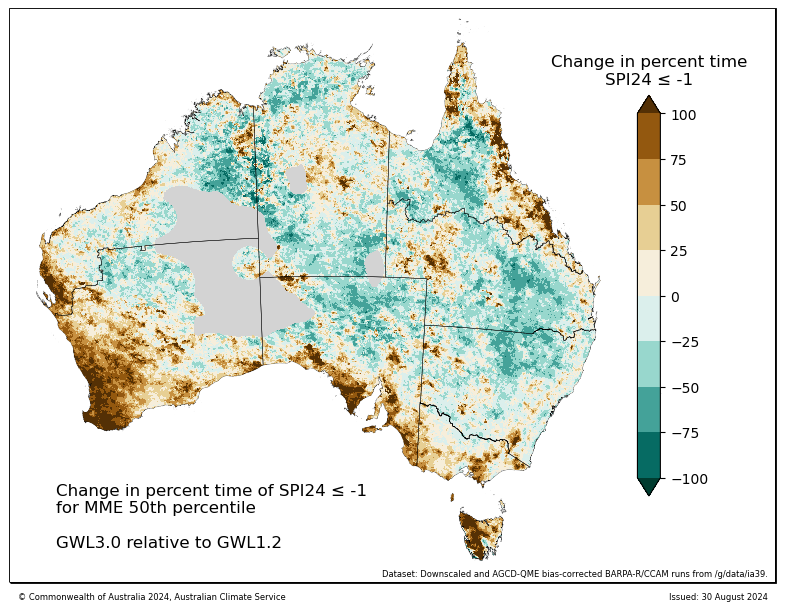

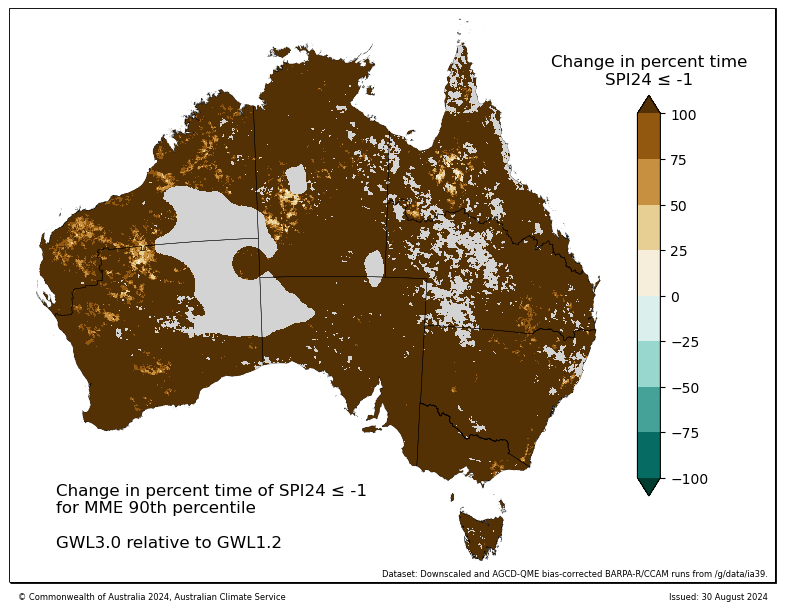

In [166]:
%%time
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    output_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    
for GWL in [1.5, 2.0, 3.0]:
    for percentile in [0.1, 0.5, 0.9]:
        plot_file = f'{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentiles_10-50-90.nc' if BC_SWITCH == False else f'{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_ACS-QME-AGCD-1960-2022_percentiles_10-50-90.nc' if BC_SWITCH == True else f'{output_dir}SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentiles_10-50-90.nc'
        cmap_grey_mask = cmap_dict["pr_anom"].reversed()
        cmap_grey_mask.set_bad(color="lightgrey")
        
        plot_acs_hazard(data = (xr.open_dataset(plot_file).sel(quantile=percentile).SPI24) if BC_SWITCH == False else (xr.open_dataset(plot_file).sel(quantile=percentile).SPI24).where(q_mask.mask),
                        regions = regions_dict['ncra_regions'],
                        cmap = cmap_grey_mask,
                        ticks = np.arange(-100, 100.1, 25),
                        cbar_label = f"Change in percent time\nSPI{accumulation} ≤ -1",
                        cbar_extend = "both",
                        title = f"Change in percent time of SPI{accumulation} ≤ -1\nfor MME {str(int(percentile*100))}th percentile\n",
                        dataset_name = "Downscaled, not bias-corrected BARPA-R/CCAM runs from /g/data/ia39." if BC_SWITCH == False else "Downscaled and AGCD-QME bias-corrected BARPA-R/CCAM runs from /g/data/ia39.",
                        date_range = f"GWL{str(GWL)} relative to GWL1.2",
                        contourf = False,
                        contour = False,
                        watermark= None,
                        outfile = f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentile_{str(int(percentile*100))}.png" if BC_SWITCH == False else f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_ACS-QME-AGCD-1960-2022_percentile_{str(int(percentile*100))}_masked.png" if BC_SWITCH == True else f"{output_dir}figures/SPI{accumulation}_pct_time_below_-1_MME_change_GWL{str(GWL)}_to_GWL1.2_percentile_{str(int(percentile*100))}.png"
                       );

## Regional statistics and heatmaps
using IPCC-style method - 'Method 3 - IPCC style' (metric and regional mean for each model, then multi model median)

In [150]:
cd /g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps

/g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps


In [158]:
from acs_area_statistics import acs_regional_stats, regions

In [10]:
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
   
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    

files = []
files.extend(sorted(glob.glob("{}/*AGCD-05i*{}".format(input_dir, '.nc')))) if BC_SWITCH == True else files.extend(sorted(glob.glob("{}/*__*{}".format(input_dir, '.nc'))))

In [11]:
files

['/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.5.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL2.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL3.0.nc',
 '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_CSIRO_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_

In [12]:
files_GWL12 = [file for file in files if 'GWL1.2' in file]

In [87]:
def plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=False):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap

    min_max_extent = {1.5:10, 2.0:15, 3.0:20}
    sns.set(font_scale=1.5)
    plt.figure(figsize=(18, 7))
    colors = sns.color_palette("BrBG_r", 10)
    cmap = ListedColormap(colors)
    
    ax = sns.heatmap(plot_df, annot=True, cmap=cmap, linewidth=2, fmt='.0f',
                     cbar_kws={'extend':'both', 'label':'Percent Change (%)'},
                     center=0,
                     vmin=-(min_max_extent[GWL_level]) if variable_colourbar_switch else -100,
                     vmax=(min_max_extent[GWL_level]) if variable_colourbar_switch else 100,
                     yticklabels=list(change_df['abbrevs']),
                     xticklabels=[key[:-5].replace('_', ' ').replace('BOM', 'BARPA').replace('CSIRO', 'CCAM') for key in plot_df.columns])
    
    ax.text(len(plot_df.columns) + 0.85, - 0.5, 'Median' , ha='center', va='center')
    ax.text(len(plot_df.columns) + 0.23, 12, r"$\bf{Bold}$" + ' = at least\n66% of ensemble\nmembers agree on \nsign of the change' , size=16, ha='left', va='center', bbox=dict(boxstyle="round,pad=0.7", edgecolor="black", facecolor="none", linewidth=0.25))
    for i, row in plot_df.iterrows():
        median = row.median()
        sign_agreement = ((row>0).sum()/len(row)) if median > 0 else ((row<0).sum()/len(row))
        fontweight = 'bold' if sign_agreement >= 0.66 else 'normal'
        ax.text(len(plot_df.columns) + 0.85, i + 0.5, f'{median:.1f}', ha='center', va='center', fontweight=fontweight)
    #make sure zero values are not coloured positively
    for text in ax.texts:
        x, y = text.get_position()
        if (text.get_text()=='0' or text.get_text()=='-0') and x<13:
            ax.text(x, y, '   0   ', ha='center', va='center', bbox=dict(pad=10.0, edgecolor="none", facecolor="lightgrey"))
            
    cbar = ax.collections[0].colorbar
    cbar.ax.set_position([0.83, 0.15, 0.03, 0.7])
    
    ax.set_title(f'Percent change in time spent in SPI{accumulation} ≤ -1 for GWL {str(GWL_level)} relative to GWL 1.2' if BC_SWITCH == True else f'Percent change in time spent in SPI{accumulation} ≤ -1 for GWL {str(GWL_level)} relative to GWL 1. (raw model outputs)',\
                 fontweight='bold', pad=20)
    
    plt.savefig(f'/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/figures/SPI_regional_heatmap_change_GWL{GWL_level}.png' if BC_SWITCH == True else f'/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/figures/SPI_regional_heatmap_change_GWL{GWL_level}.png',\
                bbox_inches='tight')
    plt.show()
    plt.clf()
    return

---> Plotting GWL1.5 with consistent colourbar across GWLs


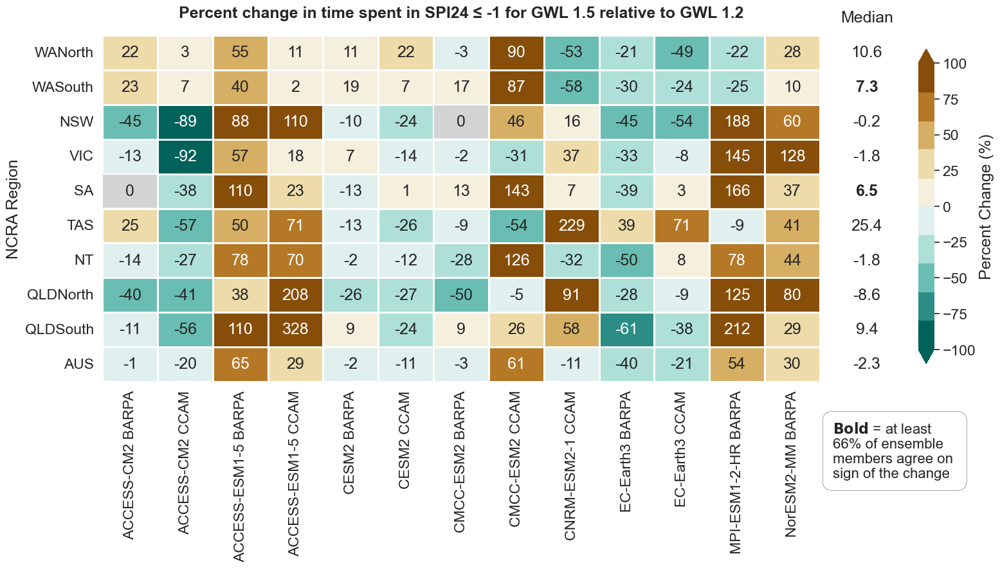

---> Plotting GWL2.0 with consistent colourbar across GWLs


<Figure size 640x480 with 0 Axes>

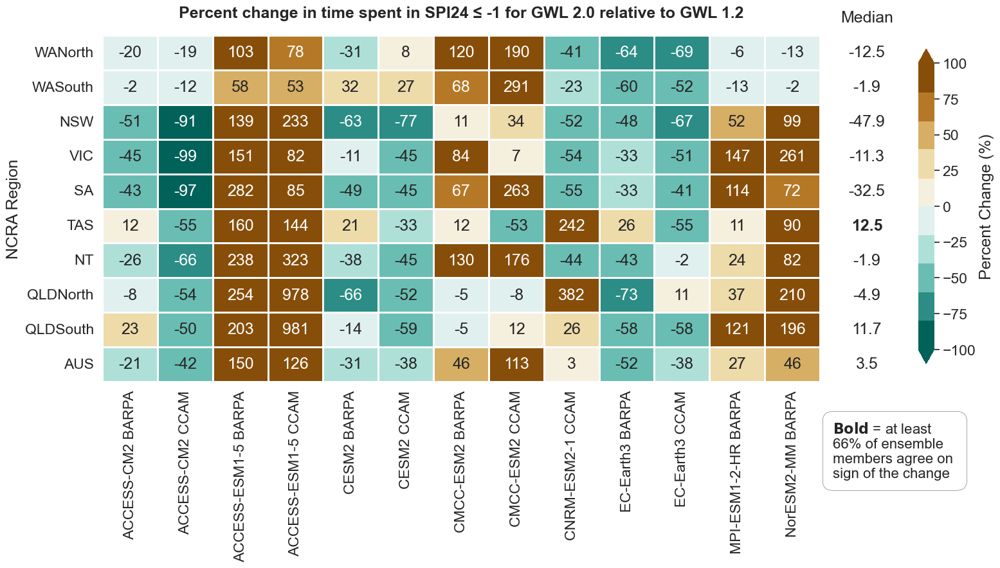

---> Plotting GWL3.0 with consistent colourbar across GWLs


<Figure size 640x480 with 0 Axes>

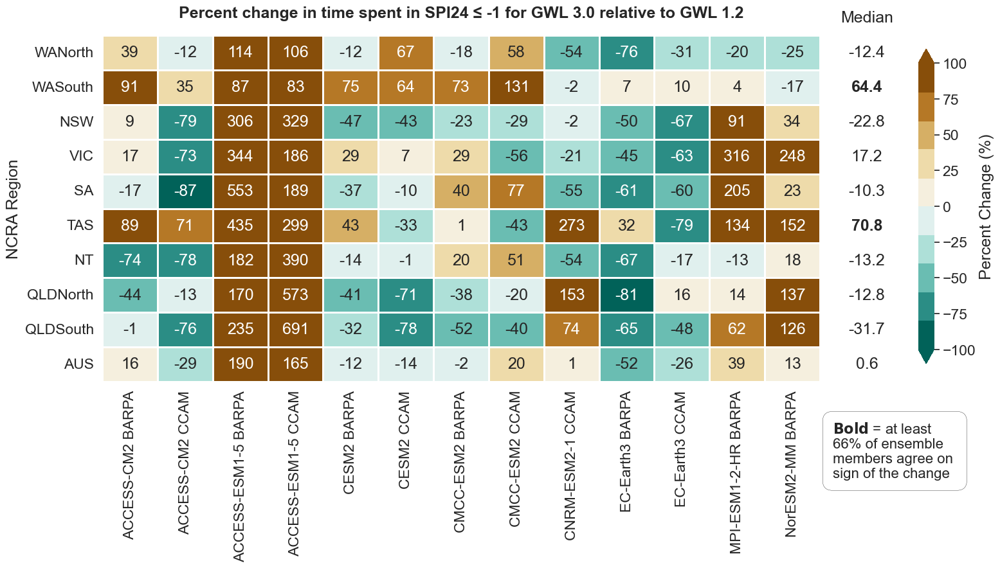

CPU times: user 13min 17s, sys: 1min 8s, total: 14min 26s
Wall time: 14min 28s


<Figure size 640x480 with 0 Axes>

In [88]:
%%time
min_max_extent = {1.5:10, 2.0:15, 3.0:20}
target_lon = xr.open_dataset('/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/SPI24pct_time_below_-1__ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_raw_GWL3.0.nc')['lon']
target_lat = xr.open_dataset('/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/SPI24pct_time_below_-1__ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_raw_GWL3.0.nc')['lat']

for GWL_level in [1.5, 2.0, 3.0]:
    df_list = []
    for file_GWL12 in files_GWL12:
        file_GWLx = [file for file in files if file_GWL12.split('_')[-8] in file and file_GWL12.split('_')[-5] in file and f'GWL{str(GWL_level)}' in file][0]
    
        ensemble_member_name = file_GWL12.split('_')[-8]+'_'+file_GWL12.split('_')[-5]
        ds_GWLx = xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).where(q_mask.mask) if BC_SWITCH == True else xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).interp(lon=target_lon, lat=target_lat)
        ds_GWL12 = xr.open_dataset(file_GWL12).rename({'SPI24': ensemble_member_name}).where(q_mask.mask) if BC_SWITCH == True else xr.open_dataset(file_GWL12).rename({'SPI24': ensemble_member_name}).interp(lon=target_lon, lat=target_lat)
        GWLx_change = ((ds_GWLx - ds_GWL12)/ds_GWL12*100).rename({list(ds_GWLx.data_vars)[0]: ensemble_member_name})      
        mask_frac = regions.mask_3D_frac_approx(GWLx_change)
        dims = ("lat", "lon",)
        GWLx_df = acs_regional_stats(ds=ds_GWLx,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        GWL12_df = acs_regional_stats(ds=ds_GWL12,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        change_df = GWL12_df
        change_df[f'{ensemble_member_name}_mean'] = 100*(GWLx_df[f'{ensemble_member_name}_mean']-GWL12_df[f'{ensemble_member_name}_mean'])/GWL12_df[f'{ensemble_member_name}_mean']
        df_list.append(change_df[change_df.columns[-1]])
        # ds_GWLx = xr.open_dataset(file_GWLx).where(q_mask.mask)
        # ds_GWL12 = xr.open_dataset(file_GWL12).where(q_mask.mask)
        # GWLx_change = ((ds_GWLx - ds_GWL12)/ds_GWL12*100)
        # GWLx_change.SPI24.values = np.ma.masked_invalid(GWLx_change.SPI24.values)
        # GWLx_change = GWLx_change.rename({'SPI24': ensemble_member_name})      
        # mask_frac = regions.mask_3D_frac_approx(GWLx_change)
        # dims = ("lat", "lon",)
        # change_df = acs_regional_stats(ds=GWLx_change,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        # df_list.append(change_df[change_df.columns[-1]])

    plot_df = pd.concat(df_list, axis=1).rename_axis('NCRA Region')
    
    # print(f'---> Plotting GWL{str(GWL_level)} with variable colourbar across GWLs')
    # plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=True)
    
    print(f'---> Plotting GWL{str(GWL_level)} with consistent colourbar across GWLs')
    plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=False)


### Do absolute heatmaps with regional mean and multi model median

In [89]:
def plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=False):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap

    min_max_extent = {1.5:10, 2.0:15, 3.0:20}
    sns.set(font_scale=1.5)
    plt.figure(figsize=(18, 7))
    # colors = sns.color_palette("Oranges_r"], 12)
    cmap = cmap_dict["pr_chance_extremes"]#ListedColormap(colors)
    
    ax = sns.heatmap(plot_df, annot=True, cmap=cmap, linewidth=2, fmt='.0f',
                     cbar_kws={'extend':'max', 'label':'Percent (%)'},
                     # center=0,
                     vmin=-(min_max_extent[GWL_level]) if variable_colourbar_switch else 0,
                     vmax=(min_max_extent[GWL_level]) if variable_colourbar_switch else 40,
                     yticklabels=list(df['abbrevs']),
                     xticklabels=[key[:-5].replace('_', ' ').replace('BOM', 'BARPA').replace('CSIRO', 'CCAM') for key in plot_df.columns])
    
    ax.text(len(plot_df.columns) + 0.85, - 0.5, 'Median' , ha='center', va='center')
    # ax.text(len(plot_df.columns) + 0.23, 12, r"$\bf{Bold}$" + ' = at least\n70% of ensemble\nmembers agree on \nsign of the change' , size=16, ha='left', va='center', bbox=dict(boxstyle="round,pad=0.7", edgecolor="black", facecolor="none", linewidth=0.25))
    for i, row in plot_df.iterrows():
        median = row.median()
        # sign_agreement = ((row>0).sum()/len(row)) if median > 0 else ((row>0).sum()/len(row))
        # fontweight = 'bold' if sign_agreement >= 0.7 else 'normal'
        ax.text(len(plot_df.columns) + 0.85, i + 0.5, f'{median:.0f}', ha='center', va='center', fontweight='normal')

    #make sure zero values are not coloured positively
    for text in ax.texts:
        x, y = text.get_position()
        if (text.get_text()=='0' or text.get_text()=='-0') and x<13:
            ax.text(x, y, f'   {text.get_text()}   ', ha='center', va='center', bbox=dict(pad=10.0, edgecolor="none", facecolor="lightgrey"))
            
    cbar = ax.collections[0].colorbar
    cbar.ax.set_position([0.83, 0.15, 0.03, 0.7])
    
    ax.set_title(f'Time spent in SPI{accumulation} ≤ -1 for GWL {str(GWL_level)}' if BC_SWITCH == True else f'Time spent in SPI{accumulation} ≤ -1 for GWL {str(GWL_level)} (raw model outputs)', fontweight='bold', pad=20)
    
    plt.savefig(f'/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/figures/SPI_regional_heatmap_absolute_GWL{GWL_level}.png' if BC_SWITCH == True else f'/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/figures/SPI_regional_heatmap_absolute_GWL{GWL_level}.png',\
                bbox_inches='tight')
    plt.show()
    plt.clf()
    return

---> Plotting GWL1.2 with consistent colourbar across GWLs


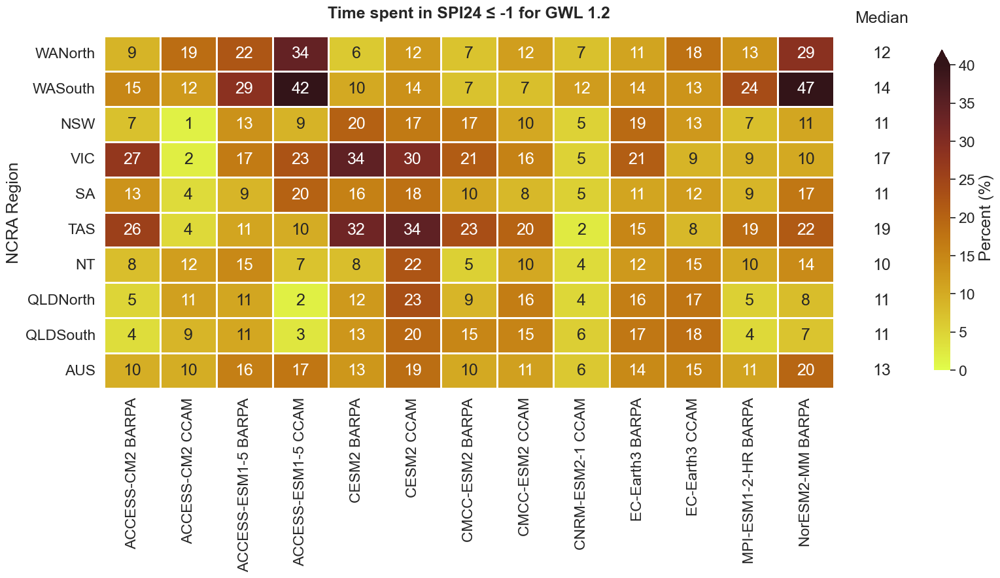

---> Plotting GWL1.5 with consistent colourbar across GWLs


<Figure size 640x480 with 0 Axes>

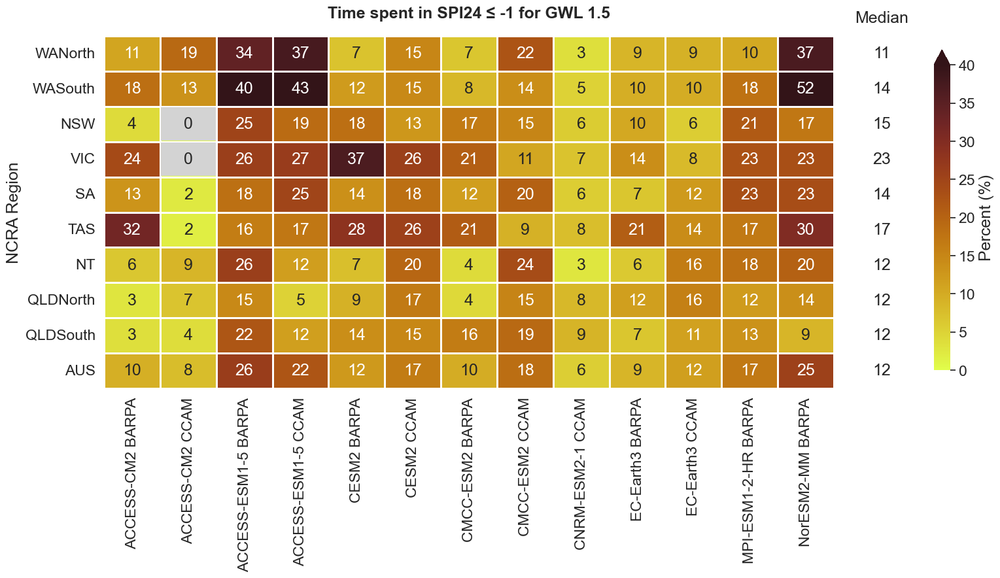

---> Plotting GWL2.0 with consistent colourbar across GWLs


<Figure size 640x480 with 0 Axes>

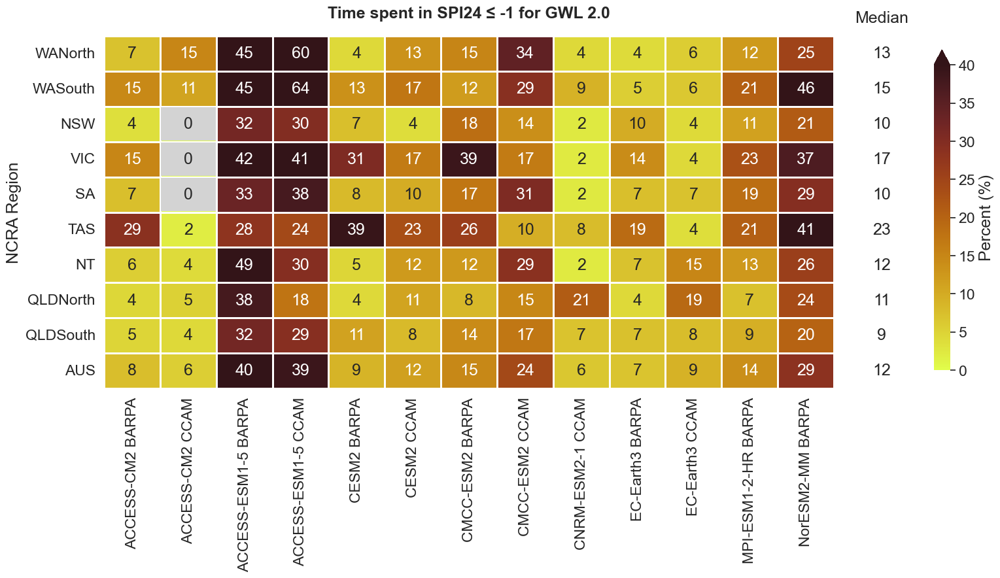

---> Plotting GWL3.0 with consistent colourbar across GWLs


<Figure size 640x480 with 0 Axes>

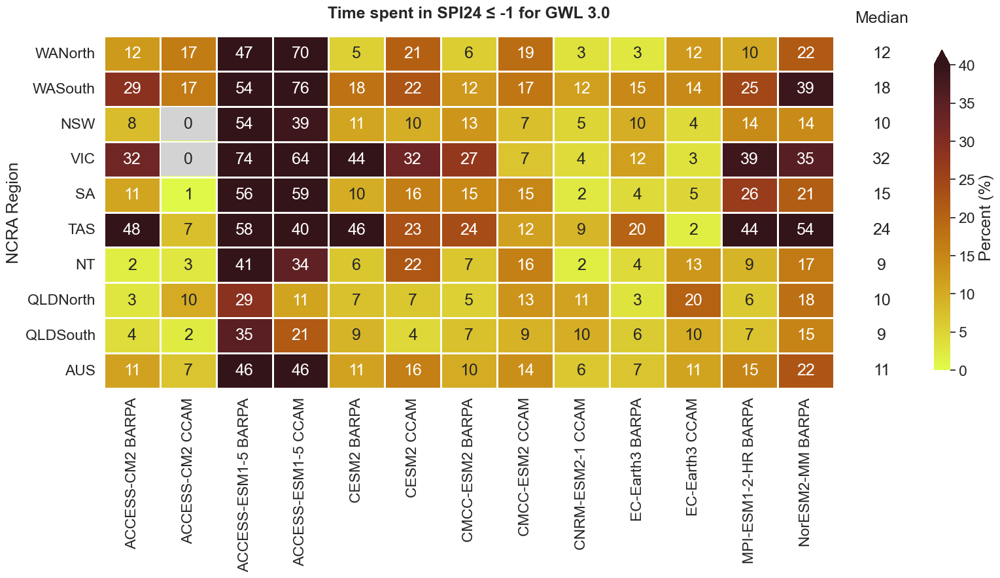

CPU times: user 17min 49s, sys: 1min 34s, total: 19min 24s
Wall time: 19min 29s


<Figure size 640x480 with 0 Axes>

In [90]:
%%time
min_max_extent = {1.5:10, 2.0:15, 3.0:20}

for GWL_level in [1.2, 1.5, 2.0, 3.0]:
    df_list = []
    for file_ in files_GWL12:
        file_GWLx = [file for file in files if file_.split('_')[-8] in file and file_.split('_')[-5] in file and f'GWL{str(GWL_level)}' in file][0]
    
        ensemble_member_name = file_.split('_')[-8]+'_'+file_.split('_')[-5]
        GWLx = xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).where(q_mask.mask) if BC_SWITCH == True else xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).interp(lon=target_lon, lat=target_lat)   
        mask_frac = regions.mask_3D_frac_approx(GWLx)
        dims = ("lat", "lon",)
        df = acs_regional_stats(ds=GWLx,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        df_list.append(df[df.columns[-1]])

    plot_df = pd.concat(df_list, axis=1).rename_axis('NCRA Region')
    
    # print(f'---> Plotting GWL{str(GWL_level)} with variable colourbar across GWLs')
    # plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=True)
    
    print(f'---> Plotting GWL{str(GWL_level)} with consistent colourbar across GWLs')
    plot_heatmap(plot_df, GWL_level, variable_colourbar_switch=False)


## Apply to water allocation shapefile provided by Ulrike

In [4]:
cd /g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps

/g/data/mn51/users/jb6465/drought-github/submodules/plotting_maps


In [5]:
from acs_area_statistics import acs_regional_stats, regions

In [6]:
import geopandas as gpd
import regionmask

gdfs = {}
PATH = "/g/data/ia39/ncra/drought_aridity/water_security_shapefiles"
    
gdf = gpd.read_file(("/g/data/ia39/ncra/drought_aridity/water_security_shapefiles/Allocation_nationalCombined.shp"))

In [7]:
gdf = gdf[~gdf['layer'].str.contains('Tasmania_geographic_regions', na=False)]
gdf = gdf[~gdf['WAP_SN'].str.contains('Ti Tree', na=False)]
gdf['srt_title'] = gdf['srt_title'] + '_' + gdf['plan_type']
gdf.loc[gdf['geo_zones'].notna(), 'geo_zones'] = gdf['CATCH_NAME']
gdf['merged'] = gdf[['srt_title', 'abs_name', 'CMANAME','geo_zones','REGIONNAME','name','RWSNAME', 'CLIMZONE', 'WCD_SN']].apply(lambda x: ', '.join(x.dropna()), axis=1)

In [8]:
gdf = gdf.dropna(subset=['merged'])

In [9]:
gdf = gdf[gdf['merged'] != '']

<GeoAxes: >

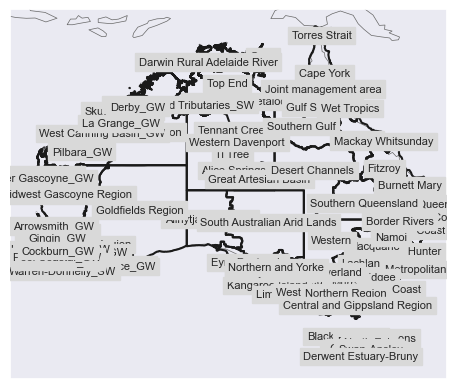

In [33]:
regionmask.from_geopandas(gdf, names="merged", overlap=True).plot(label="name", text_kws = dict(fontsize=8,))

In [11]:
regions = regionmask.from_geopandas(gdf, names="merged", overlap=True)

In [12]:
ds_GWLx = xr.open_dataset('/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/SPI24pct_time_below_-1_AGCD-05i_ACCESS-CM2_ssp370_r4i1p1f1_BOM_v1-r1_baseperiod19652014_ACS-QME-AGCD-1960-2022_GWL1.2.nc')
mask_frac = regions.mask_3D_frac_approx(ds_GWLx)
dims = ("lat", "lon",)

In [13]:
acs_regional_stats(ds=ds_GWLx,var='SPI24', mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()

,abbrevs,names,SPI24_mean
region,,,
3,r3,North Coast,1.056616
4,r4,Far North Coast,2.242931
5,r5,Sydney Metropolitan,2.689652
6,r6,Gwydir,1.742591
7,r7,Greater Hunter,1.319695
...,...,...,...
148,r148,Lower Collie_SW,32.833785
149,r149,Peel Coastal_GW,33.038458
150,r150,Gingin_GW,36.411912


In [14]:
if BC_SWITCH and accumulation == 3:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/'
   
elif BC_SWITCH and accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/'
    
elif accumulation == 24:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/'
    
else:
    input_dir = '/g/data/ia39/ncra/drought_aridity/spi/downscaled_notBC_5km/'
    

files = []
files.extend(sorted(glob.glob("{}/*AGCD-05i*{}".format(input_dir, '.nc')))) if BC_sWITCH == True else files.extend(sorted(glob.glob("{}/*__*{}".format(input_dir, '.nc'))))
files_GWL12 = [file for file in files if 'GWL1.2' in file]

In [15]:
def plot_water_allocation_heatmap(plot_df, GWL_level, mask_switch):
    import seaborn as sns
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap
    
    sns.set(font_scale=1)
    plt.figure(figsize=(10, 40))
    colors = sns.color_palette("BrBG_r", 10)
    cmap = ListedColormap(colors)
    
    ax = sns.heatmap(plot_df, annot=True, cmap=cmap, linewidth=2, fmt='.0f',
                     cbar_kws={'extend':'both', "orientation": "horizontal"},
                     center=0,
                     vmin=-100,
                     vmax=100,
                     yticklabels=list(change_df['names']),
                     xticklabels=[key[:-5].replace('_', ' ').replace('BOM', 'BARPA').replace('CSIRO', 'CCAM') for key in plot_df.columns])
    
    ax.text(len(plot_df.columns) + 0.85, - 0.5, 'Median' , ha='center', va='center')
    ax.text(6.5, -1.2, r"$\bf{Bold\ medians}$" + ' = at least 66% of ensemble members agree on sign of the change' , color='grey', size=10, ha='center', va='center', bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="none", linewidth=0.25))
    for i, row in enumerate(plot_df.iterrows()):
        row = row[1]
        median = row.median()
        sign_agreement = ((row>0).sum()/len(row)) if median > 0 else ((row<0).sum()/len(row))
        fontweight = 'bold' if sign_agreement >= 0.66 else 'normal'
        ax.text(len(plot_df.columns) + 0.85, i + 0.5, f'{median:.1f}', ha='center', va='center', fontweight=fontweight)
    #make sure zero values are not coloured positively
    for text in ax.texts:
        x, y = text.get_position()
        if (text.get_text()=='0' or text.get_text()=='-0') and x<13:
            ax.text(x, y, '    0    ', ha='center', va='center', bbox=dict(pad=3, edgecolor="none", facecolor="lightgrey"))
            
    cbar = ax.collections[0].colorbar
    cbar.ax.set_position([0.16, 0.90, 0.7, 0.003])
    ax.set_title(f'Percent change in time spent in SPI{accumulation} ≤ -1 for GWL {str(GWL_level)} relative to GWL 1.2', size=14, fontweight='bold', pad=100)
    ax.text(6.5, -5.1, '\n (AGCD quality mask applied)' if mask_switch == True else '\n (Raw model outputs)', ha='center', va='center', size=12)
    mask_switch_save_str = '_AGCD_masked' if mask_switch == True else '_unmasked'
    plt.savefig(f'/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/figures/heatmaps/SPI_water_allocation_heatmap_change_GWL{GWL_level}{mask_switch_save_str}.png' if BC_SWITCH == True else f'/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/figures/heatmaps/SPI_water_allocation_heatmap_change_GWL{GWL_level}{mask_switch_save_str}.png', bbox_inches='tight')
    plot_df.set_index(change_df['names']).to_csv(f'/g/data/ia39/ncra/drought_aridity/spi/downscaled_BC_5km/spi24_water_security/figures/heatmaps/SPI_water_allocation_heatmap_change_GWL{GWL_level}{mask_switch_save_str}.csv' if BC_SWITCH == True else f'/g/data/ia39/ncra/drought_aridity/spi/raw/spi24_water_security/figures/heatmaps/SPI_water_allocation_heatmap_change_GWL{GWL_level}{mask_switch_save_str}.csv')
    plt.show()
    plt.clf()
    return

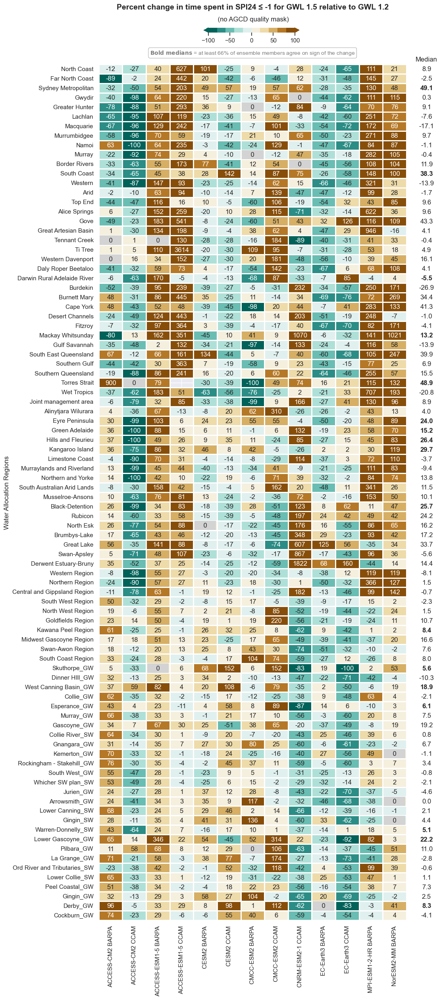

<Figure size 640x480 with 0 Axes>

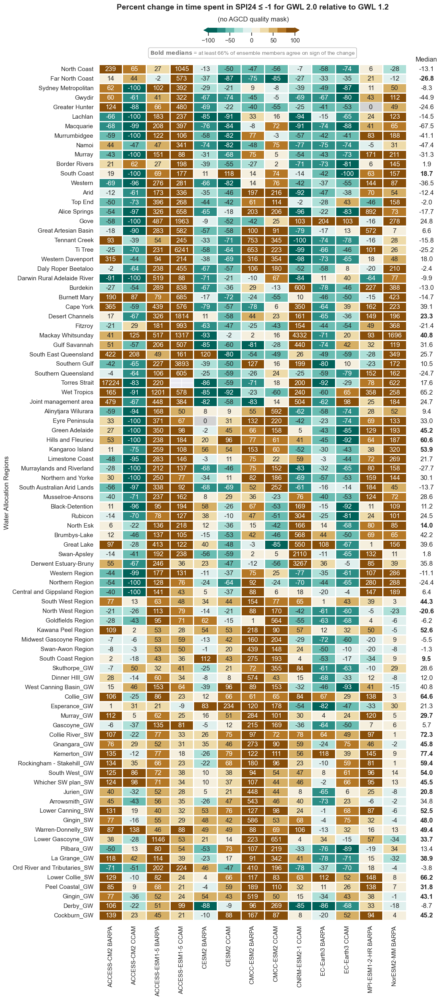

<Figure size 640x480 with 0 Axes>

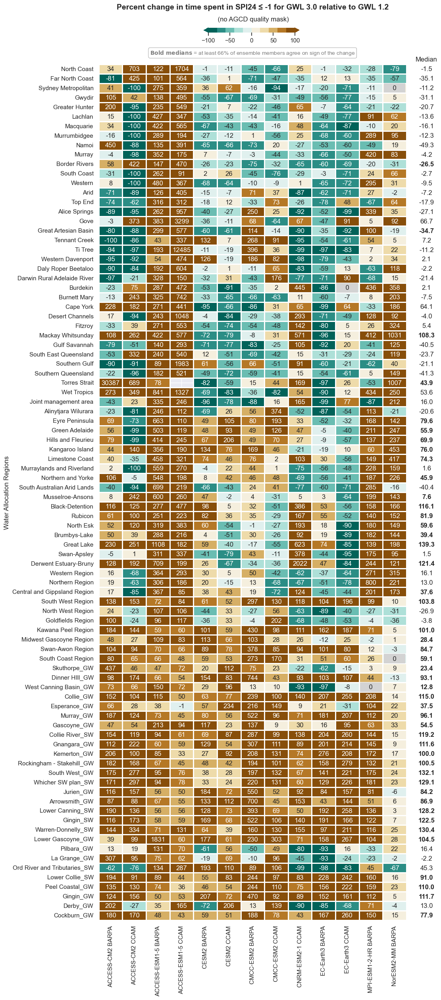

CPU times: user 14min 58s, sys: 2min 45s, total: 17min 43s
Wall time: 17min 49s


<Figure size 640x480 with 0 Axes>

In [16]:
%%time
mask_switch = False
mask_ds = xr.open_dataset("/g/data/mn51/users/dh4185/agcd_v1-0-2_precip_weight_r005_daily_1975_2005fraction_ge1.nc")
q_mask = np.ma.masked_greater(mask_ds.fraction,0.8)

for GWL_level in [1.5, 2.0, 3.0]:
    df_list = []
    for file_GWL12 in files_GWL12:
        file_GWLx = [file for file in files if file_GWL12.split('_')[-8] in file and file_GWL12.split('_')[-5] in file and f'GWL{str(GWL_level)}' in file][0]
    
        ensemble_member_name = file_GWL12.split('_')[-8]+'_'+file_GWL12.split('_')[-5]
        masked_files = [xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).where(q_mask.mask) if mask_switch == True else xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}),\
                        xr.open_dataset(file_GWL12).rename({'SPI24': ensemble_member_name}).where(q_mask.mask) if mask_switch == True else xr.open_dataset(file_GWL12).rename({'SPI24': ensemble_member_name})]
        ds_GWLx = masked_files[0] if BC_SWITCH == True else xr.open_dataset(file_GWLx).rename({'SPI24': ensemble_member_name}).interp(lon=target_lon, lat=target_lat)
        ds_GWL12 = masked_files[1] if BC_SWITCH == True else xr.open_dataset(file_GWL12).rename({'SPI24': ensemble_member_name}).interp(lon=target_lon, lat=target_lat)
        mask_frac = regions.mask_3D_frac_approx(ds_GWLx)
        dims = ("lat", "lon",)
        GWLx_df = acs_regional_stats(ds=ds_GWLx,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        GWL12_df = acs_regional_stats(ds=ds_GWL12,var=ensemble_member_name, mask=mask_frac, dims = dims, how = ["mean"]).to_dataframe()
        change_df = GWL12_df
        change_df[f'{ensemble_member_name}_mean'] = 100*(GWLx_df[f'{ensemble_member_name}_mean']-GWL12_df[f'{ensemble_member_name}_mean'])/GWL12_df[f'{ensemble_member_name}_mean']
        df_list.append(change_df[change_df.columns[-1]])


    plot_df = pd.concat(df_list, axis=1).rename_axis('Water Allocation Regions')
    plot_water_allocation_heatmap(plot_df, GWL_level, mask_switch)
